In [1]:
import math
import numpy as np
np.random.seed(24)
import pandas as pd
from tqdm import tqdm

from sympy import *
import operator
from IPython.core.display import display

from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import roc_curve, auc, precision_recall_curve, average_precision_score
from sklearn.preprocessing import StandardScaler

import torch
torch.manual_seed(24)
from torch.autograd import Variable
import torch.utils.data as data_utils
import torch.nn.init as init
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

import warnings
warnings.filterwarnings('ignore')

import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style='whitegrid')
sns.set_palette("bright")

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

# Load and Prepare Data

In [2]:
data = load_breast_cancer()

In [3]:
X = data['data']
y = data['target']
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.3, random_state=24)
X_val, X_test, y_val, y_test = train_test_split(X_val, y_val, test_size=0.5, random_state=24)
X_train = Variable(torch.from_numpy(X_train))
X_val = Variable(torch.from_numpy(X_val))
y_train = Variable(torch.from_numpy(y_train))
y_val = Variable(torch.from_numpy(y_val))
X_test = Variable(torch.from_numpy(X_test))
y_test = Variable(torch.from_numpy(y_test))

In [4]:
X.shape

(569, 30)

In [5]:
df_data = pd.DataFrame(X, columns=data['feature_names'])
df_data['target'] = y
df_benign = df_data[df_data['target'] == 1].reset_index(drop=True)
df_malignant = df_data[df_data['target'] == 0].reset_index(drop=True)

# Exploratory Data Analysis

In [6]:
df_data.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,0
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,0
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,0
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,0
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,0


In [7]:
df_data['target'].value_counts() / len(df_data) * 100

1    62.741652
0    37.258348
Name: target, dtype: float64

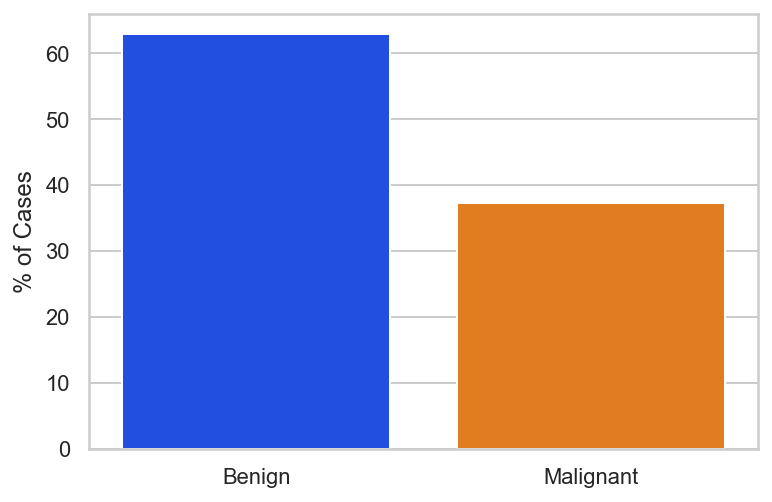

In [8]:
class_names = ['Benign', 'Malignant']
class_pc = [62.8, 37.3]
f, ax = plt.subplots()
sns.barplot(x=class_names, y=class_pc, ax=ax)
ax.set_ylabel('% of Cases')
f.savefig('images/chapter_04_class_pc.png', dpi=300, bbox_inches='tight');
f.savefig('images/chapter_04_class_pc.svg', format='svg', dpi=300, bbox_inches='tight');

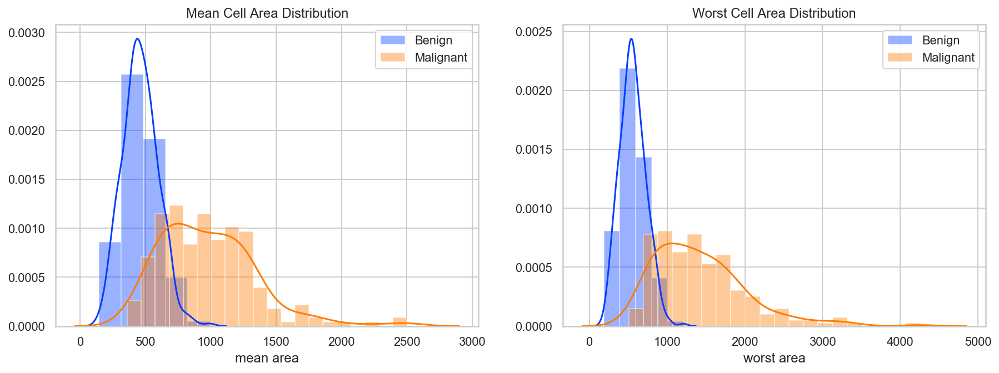

In [9]:
f, ax = plt.subplots(1, 2, figsize=(15, 5))
sns.distplot(df_benign['mean area'], bins=5, ax=ax[0], label='Benign')
sns.distplot(df_malignant['mean area'], bins=20, ax=ax[0], label='Malignant')
sns.distplot(df_benign['worst area'], bins=5, ax=ax[1], label='Benign')
sns.distplot(df_malignant['worst area'], bins=20, ax=ax[1], label='Malignant')
ax[0].legend()
ax[1].legend()
ax[0].set_title('Mean Cell Area Distribution')
ax[1].set_title('Worst Cell Area Distribution')
f.savefig('images/chapter_04_cell_area_dist.png', dpi=300, bbox_inches='tight');
f.savefig('images/chapter_04_cell_area_dist.svg', format='svg', dpi=300, bbox_inches='tight');

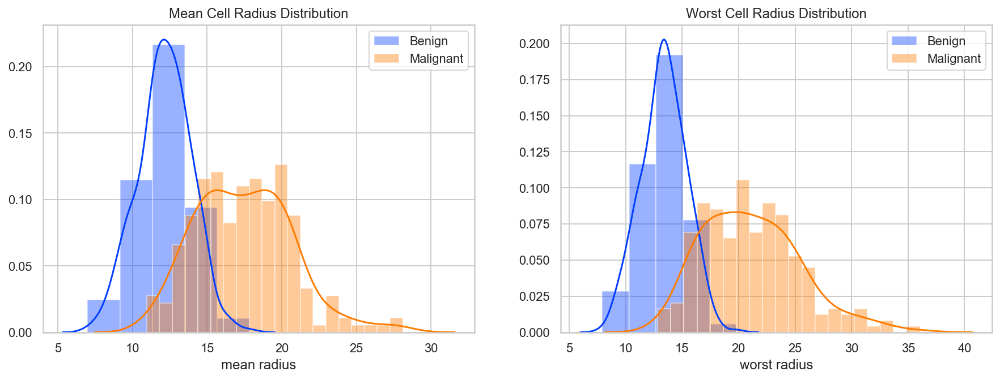

In [10]:
f, ax = plt.subplots(1, 2, figsize=(15, 5))
sns.distplot(df_benign['mean radius'], bins=5, ax=ax[0], label='Benign')
sns.distplot(df_malignant['mean radius'], bins=20, ax=ax[0], label='Malignant')
sns.distplot(df_benign['worst radius'], bins=5, ax=ax[1], label='Benign')
sns.distplot(df_malignant['worst radius'], bins=20, ax=ax[1], label='Malignant')
ax[0].legend()
ax[1].legend()
ax[0].set_title('Mean Cell Radius Distribution')
ax[1].set_title('Worst Cell Radius Distribution')
f.savefig('images/chapter_04_cell_radius_dist.png', dpi=300, bbox_inches='tight');
f.savefig('images/chapter_04_cell_radius_dist.svg', format='svg', dpi=300, bbox_inches='tight');

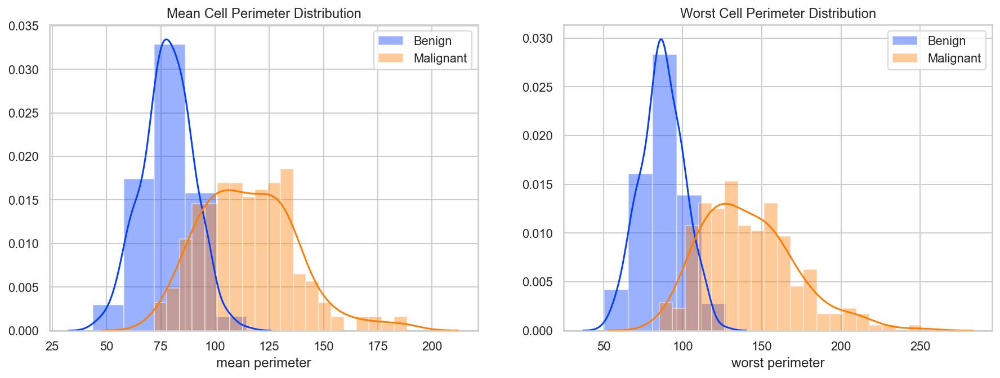

In [11]:
f, ax = plt.subplots(1, 2, figsize=(15, 5))
sns.distplot(df_benign['mean perimeter'], bins=5, ax=ax[0], label='Benign')
sns.distplot(df_malignant['mean perimeter'], bins=20, ax=ax[0], label='Malignant')
sns.distplot(df_benign['worst perimeter'], bins=5, ax=ax[1], label='Benign')
sns.distplot(df_malignant['worst perimeter'], bins=20, ax=ax[1], label='Malignant')
ax[0].legend()
ax[1].legend()
ax[0].set_title('Mean Cell Perimeter Distribution')
ax[1].set_title('Worst Cell Perimeter Distribution')
f.savefig('images/chapter_04_cell_perimeter_dist.png', dpi=300, bbox_inches='tight');
f.savefig('images/chapter_04_cell_perimeter_dist.svg', format='svg', dpi=300, bbox_inches='tight');

In [12]:
corr = df_data.corr()

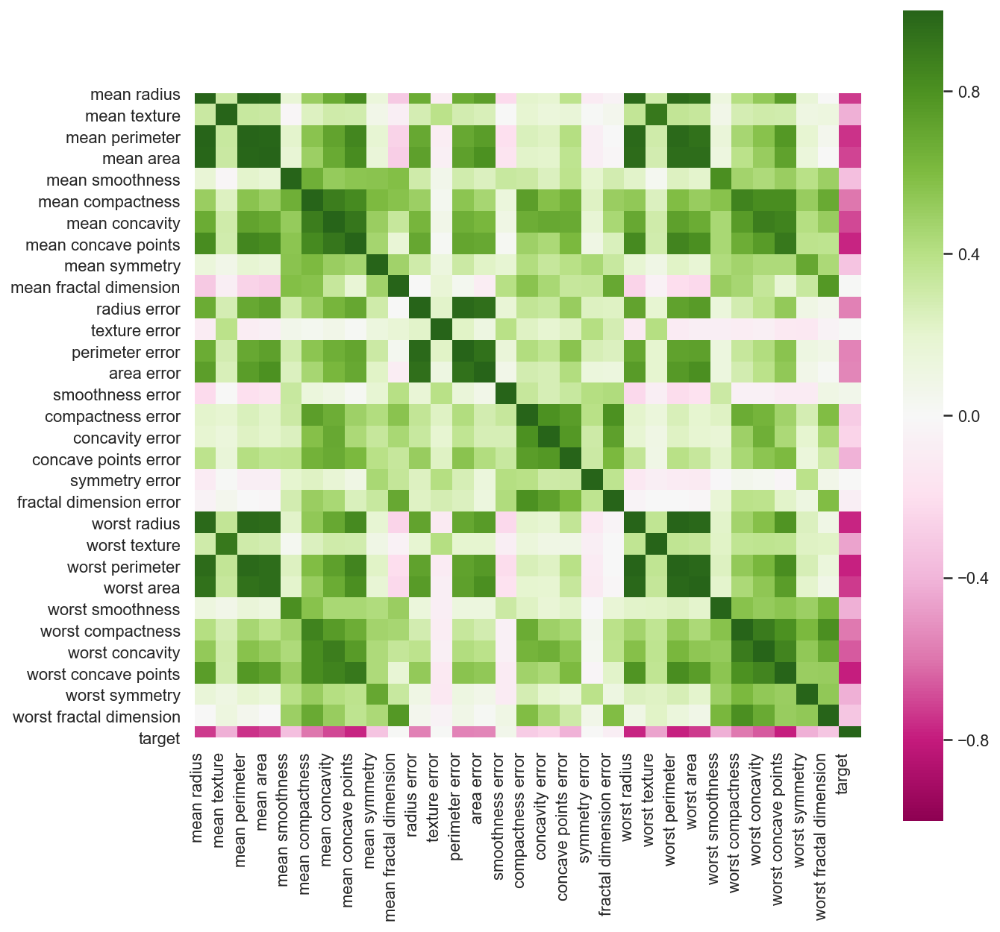

In [13]:
f, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap="PiYG",
    square=True,
    ax=ax
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=90,
    horizontalalignment='right'
);
f.savefig('images/chapter_04_feature_correlation.png', dpi=300, bbox_inches='tight');
f.savefig('images/chapter_04_feature_correlation.svg', format='svg', dpi=300, bbox_inches='tight');

In [14]:
X_train.shape

torch.Size([398, 30])

In [15]:
X_val.shape

torch.Size([85, 30])

In [16]:
y_train.shape

torch.Size([398])

In [17]:
y_val.shape

torch.Size([85])

In [18]:
X_test.shape

torch.Size([86, 30])

In [19]:
y_test.shape

torch.Size([86])

# Create and Train Model

In [20]:
class Model(torch.nn.Sequential):
    def __init__(self, layer_dims):
        super(Model, self).__init__()
        for idx, layer_dim in enumerate(layer_dims[:-1]):
            module = torch.nn.Linear(layer_dim, layer_dims[idx+1])
            self.add_module("linear" + str(idx), module)
        self.sigmoid = torch.nn.Sigmoid()

In [21]:
dim_in = X_train.shape[1]
dim_out = 1
layer_dims = [dim_in, 16, 3, dim_out]
model = Model(layer_dims)
print(model)

criterion = torch.nn.BCELoss(reduction='sum')
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

num_epochs = 500
history = { "loss": [], "accuracy": [], "loss_val": [], "accuracy_val": [] }
for epoch in range(num_epochs):
    y_pred = model(X_train.float())
    loss = criterion(y_pred, y_train.view(-1, 1).float())
    prediction = [1 if p > 0.5 else 0 for p in y_pred.data.numpy()]
    correct = (prediction == y_train.numpy()).mean()
    
    y_pred_val = model(X_val.float())
    loss_val = criterion(y_pred_val, y_val.view(-1,1).float())
    prediction_val = [1 if p > 0.5 else 0 for p in y_pred_val.data.numpy()]
    correct_val = (prediction_val == y_val.numpy()).mean()
    
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    
    print('Epoch', epoch, 'Loss:', loss.item(), '- Pred:', y_pred.data[0])
    history["loss"].append(loss.item())
    history["accuracy"].append(100 * correct)
    history["loss_val"].append(loss_val.data.item())
    history["accuracy_val"].append(100 * correct_val)

Model(
  (linear0): Linear(in_features=30, out_features=16, bias=True)
  (linear1): Linear(in_features=16, out_features=3, bias=True)
  (linear2): Linear(in_features=3, out_features=1, bias=True)
  (sigmoid): Sigmoid()
)
Epoch 0 Loss: 7224.40869140625 - Pred: tensor([1.0207e-08])
Epoch 1 Loss: 6695.56787109375 - Pred: tensor([4.1520e-08])
Epoch 2 Loss: 6172.4755859375 - Pred: tensor([1.6635e-07])
Epoch 3 Loss: 5654.67529296875 - Pred: tensor([6.5721e-07])
Epoch 4 Loss: 5141.166015625 - Pred: tensor([2.5671e-06])
Epoch 5 Loss: 4630.69775390625 - Pred: tensor([9.9444e-06])
Epoch 6 Loss: 4121.900390625 - Pred: tensor([3.8335e-05])
Epoch 7 Loss: 3613.48486328125 - Pred: tensor([0.0001])
Epoch 8 Loss: 3104.49951171875 - Pred: tensor([0.0006])
Epoch 9 Loss: 2594.6552734375 - Pred: tensor([0.0022])
Epoch 10 Loss: 2083.93310546875 - Pred: tensor([0.0084])
Epoch 11 Loss: 1573.025390625 - Pred: tensor([0.0320])
Epoch 12 Loss: 1066.1041259765625 - Pred: tensor([0.1146])
Epoch 13 Loss: 583.8396606

Epoch 154 Loss: 100.88682556152344 - Pred: tensor([0.9160])
Epoch 155 Loss: 100.77655792236328 - Pred: tensor([0.9162])
Epoch 156 Loss: 100.66667938232422 - Pred: tensor([0.9164])
Epoch 157 Loss: 100.55730438232422 - Pred: tensor([0.9166])
Epoch 158 Loss: 100.44853973388672 - Pred: tensor([0.9167])
Epoch 159 Loss: 100.34041595458984 - Pred: tensor([0.9169])
Epoch 160 Loss: 100.2330322265625 - Pred: tensor([0.9170])
Epoch 161 Loss: 100.12620544433594 - Pred: tensor([0.9172])
Epoch 162 Loss: 100.01997375488281 - Pred: tensor([0.9173])
Epoch 163 Loss: 99.91424560546875 - Pred: tensor([0.9175])
Epoch 164 Loss: 99.80899047851562 - Pred: tensor([0.9177])
Epoch 165 Loss: 99.70406341552734 - Pred: tensor([0.9180])
Epoch 166 Loss: 99.5998306274414 - Pred: tensor([0.9182])
Epoch 167 Loss: 99.49607849121094 - Pred: tensor([0.9184])
Epoch 168 Loss: 99.3929214477539 - Pred: tensor([0.9187])
Epoch 169 Loss: 99.29032897949219 - Pred: tensor([0.9189])
Epoch 170 Loss: 99.18822479248047 - Pred: tensor([

Epoch 310 Loss: 88.51312255859375 - Pred: tensor([0.9338])
Epoch 311 Loss: 88.45442962646484 - Pred: tensor([0.9339])
Epoch 312 Loss: 88.39580535888672 - Pred: tensor([0.9339])
Epoch 313 Loss: 88.33738708496094 - Pred: tensor([0.9339])
Epoch 314 Loss: 88.27914428710938 - Pred: tensor([0.9340])
Epoch 315 Loss: 88.22103118896484 - Pred: tensor([0.9340])
Epoch 316 Loss: 88.1630859375 - Pred: tensor([0.9341])
Epoch 317 Loss: 88.10533905029297 - Pred: tensor([0.9341])
Epoch 318 Loss: 88.04773712158203 - Pred: tensor([0.9341])
Epoch 319 Loss: 87.99024963378906 - Pred: tensor([0.9342])
Epoch 320 Loss: 87.93292236328125 - Pred: tensor([0.9342])
Epoch 321 Loss: 87.87577056884766 - Pred: tensor([0.9342])
Epoch 322 Loss: 87.81867218017578 - Pred: tensor([0.9343])
Epoch 323 Loss: 87.7618179321289 - Pred: tensor([0.9343])
Epoch 324 Loss: 87.70512390136719 - Pred: tensor([0.9343])
Epoch 325 Loss: 87.64856719970703 - Pred: tensor([0.9344])
Epoch 326 Loss: 87.59214782714844 - Pred: tensor([0.9344])
Ep

Epoch 468 Loss: 80.62708282470703 - Pred: tensor([0.9337])
Epoch 469 Loss: 80.5833969116211 - Pred: tensor([0.9336])
Epoch 470 Loss: 80.53962707519531 - Pred: tensor([0.9336])
Epoch 471 Loss: 80.49597930908203 - Pred: tensor([0.9336])
Epoch 472 Loss: 80.45240020751953 - Pred: tensor([0.9335])
Epoch 473 Loss: 80.4087905883789 - Pred: tensor([0.9335])
Epoch 474 Loss: 80.36522674560547 - Pred: tensor([0.9335])
Epoch 475 Loss: 80.32184600830078 - Pred: tensor([0.9334])
Epoch 476 Loss: 80.27845001220703 - Pred: tensor([0.9334])
Epoch 477 Loss: 80.23500061035156 - Pred: tensor([0.9334])
Epoch 478 Loss: 80.1916732788086 - Pred: tensor([0.9333])
Epoch 479 Loss: 80.14842987060547 - Pred: tensor([0.9333])
Epoch 480 Loss: 80.10525512695312 - Pred: tensor([0.9333])
Epoch 481 Loss: 80.06204986572266 - Pred: tensor([0.9332])
Epoch 482 Loss: 80.01896667480469 - Pred: tensor([0.9332])
Epoch 483 Loss: 79.9758529663086 - Pred: tensor([0.9332])
Epoch 484 Loss: 79.9328384399414 - Pred: tensor([0.9331])
Ep

In [22]:
index, value = max(enumerate(history["accuracy_val"]), key=operator.itemgetter(1))
print("Best accuracy was {} at iteration {}".format(value, index))

Best accuracy was 92.94117647058823 at iteration 57


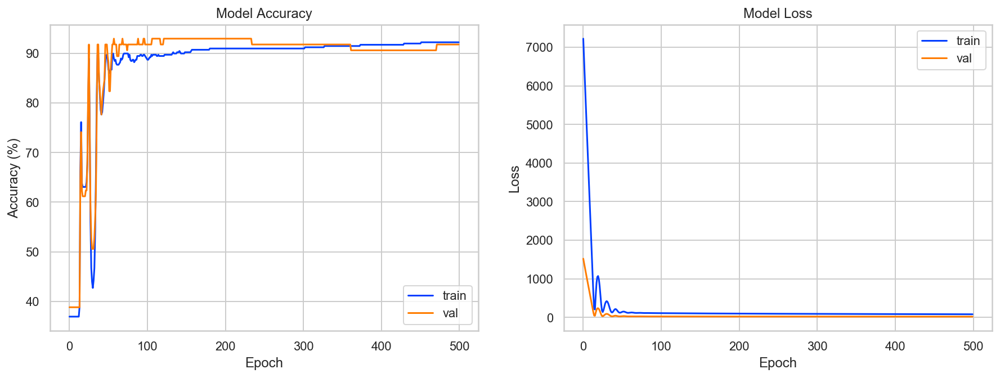

In [23]:
f, ax = plt.subplots(1,2, figsize=(15, 5))
ax[0].plot(history['accuracy'])
ax[0].plot(history['accuracy_val'])
ax[0].set_title('Model Accuracy')
ax[0].set_ylabel('Accuracy (%)')
ax[0].set_xlabel('Epoch')
ax[0].legend(['train', 'val'], loc='lower right')
ax[1].plot(history['loss'])
ax[1].plot(history['loss_val'])
ax[1].set_title('Model Loss')
ax[1].set_ylabel('Loss')
ax[1].set_xlabel('Epoch')
ax[1].legend(['train', 'val'], loc='upper right')
f.savefig('images/chapter_04_training_acc_loss_curves.png', dpi=300, bbox_inches='tight');
f.savefig('images/chapter_04_training_acc_loss_curves.svg', format='svg', dpi=300, bbox_inches='tight');

# Evaluate Model

In [24]:
y_pred_test = model.forward(X_test.float()) > 0.5

In [25]:
y_conf = model.forward(X_test.float()).detach().numpy().reshape(-1)

In [26]:
pred = y_pred_test.numpy().reshape(-1)
actual = y_test.numpy()
baseline = np.array([1 for _ in range(len(actual))])

In [27]:
from sklearn.metrics import recall_score, precision_score, f1_score

precision = precision_score(actual, pred)
p_baseline = precision_score(actual, baseline)
r_baseline = recall_score(actual, pred)
recall = recall_score(actual, baseline)
f1 = f1_score(actual, pred)
f1_baseline = f1_score(actual, baseline)
print('Precision: ', precision, 'Recall: ', recall, 'F1: ', f1)
print('(Baseline) Precision: ', p_baseline, 'Recall: ', r_baseline, 'F1: ', f1_baseline)

Precision:  0.9298245614035088 Recall:  1.0 F1:  0.954954954954955
(Baseline) Precision:  0.627906976744186 Recall:  0.9814814814814815 F1:  0.7714285714285715


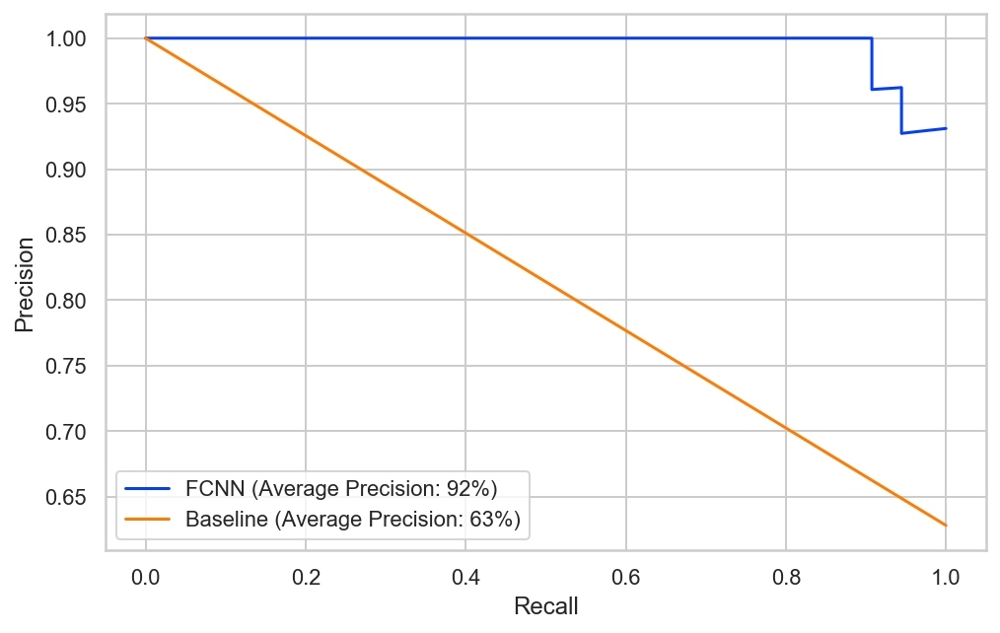

In [28]:
from sklearn.metrics import average_precision_score
pred_p, pred_r, _ = precision_recall_curve(actual, y_conf)
baseline_p, baseline_r, _ = precision_recall_curve(actual, baseline)
pred_ap = average_precision_score(actual, pred)
baseline_ap = average_precision_score(actual, baseline)
f, ax = plt.subplots(figsize=(8, 5))
ax.plot(pred_r, pred_p, label='FCNN (Average Precision: %d%%)' % round(pred_ap * 100))
ax.plot(baseline_r, baseline_p, label='Baseline (Average Precision: %d%%)' % round(baseline_ap * 100))
ax.legend()
ax.set_xlabel('Recall')
ax.set_ylabel('Precision');
f.savefig('images/chapter_04_pr_curve.png', dpi=300, bbox_inches='tight');
f.savefig('images/chapter_04_pr_curve.svg', format='svg', dpi=300, bbox_inches='tight');

# LIME Explainer

In [29]:
import lime
import lime.lime_tabular

In [30]:
explainer = lime.lime_tabular.LimeTabularExplainer(X_train.numpy(), 
                                                   feature_names=data.feature_names, 
                                                   class_names=data.target_names, 
                                                   discretize_continuous=True)

In [31]:
benign_idx = np.where(y_test.numpy() == 1)[0][0]
malignant_idx = np.where(y_test.numpy() == 0)[0][0]

In [32]:
benign_idx

0

In [33]:
malignant_idx

14

In [34]:
def lime_exp_as_pyplot(exp, label=0, figsize=(8,5)):
    exp_list = exp.as_list(label=label)
    fig, ax = plt.subplots(figsize=figsize)
    vals = [x[1] for x in exp_list]
    names = [x[0] for x in exp_list]
    vals.reverse()
    names.reverse()
    colors = ['green' if x > 0 else 'red' for x in vals]
    pos = np.arange(len(exp_list)) + .5
    ax.barh(pos, vals, align='center', color=colors)
    plt.yticks(pos, names)
    return fig, ax

In [35]:
def prob(data):
    return model.forward(Variable(torch.from_numpy(data)).float()).detach().numpy().reshape(-1, 1)

In [36]:
y_conf[benign_idx]

0.9155207

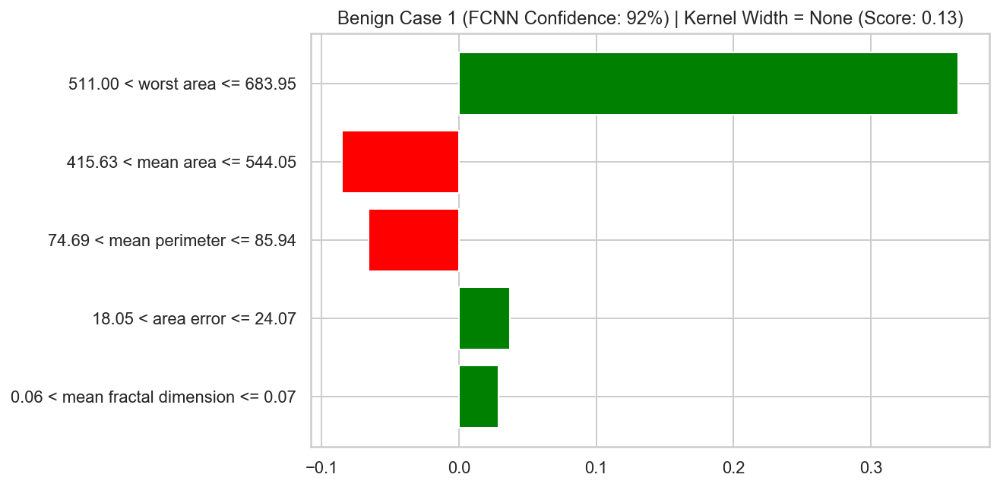

In [76]:
exp = explainer.explain_instance(X_test.numpy()[benign_idx], 
                                 prob, 
                                 num_features=5, 
                                 top_labels=1)
f, ax = lime_exp_as_pyplot(exp)
ax.set_title('Benign Case 1 (FCNN Confidence: %d%%) | Kernel Width = None (Score: %.2f)' % (round(y_conf[benign_idx] * 100),
                                                                                            exp.score))
f.savefig('images/chapter_04_lime_benign.png', dpi=300, bbox_inches='tight');
f.savefig('images/chapter_04_lime_benign.svg', format='svg', dpi=300, bbox_inches='tight');

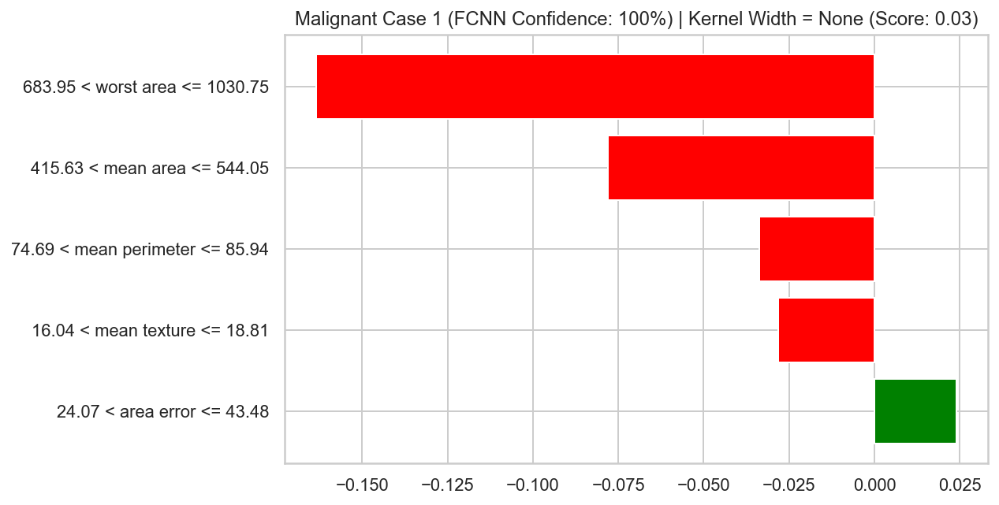

In [77]:
exp = explainer.explain_instance(X_test.numpy()[malignant_idx], 
                                 prob, 
                                 num_features=5, 
                                 top_labels=1)
f, ax = lime_exp_as_pyplot(exp)
ax.set_title('Malignant Case 1 (FCNN Confidence: %d%%) | Kernel Width = None (Score: %.2f)' % (100 - round(y_conf[malignant_idx] * 100),
                                                                                               exp.score))
f.savefig('images/chapter_04_lime_malignant.png', dpi=300, bbox_inches='tight');
f.savefig('images/chapter_04_lime_malignant.svg', format='svg', dpi=300, bbox_inches='tight');

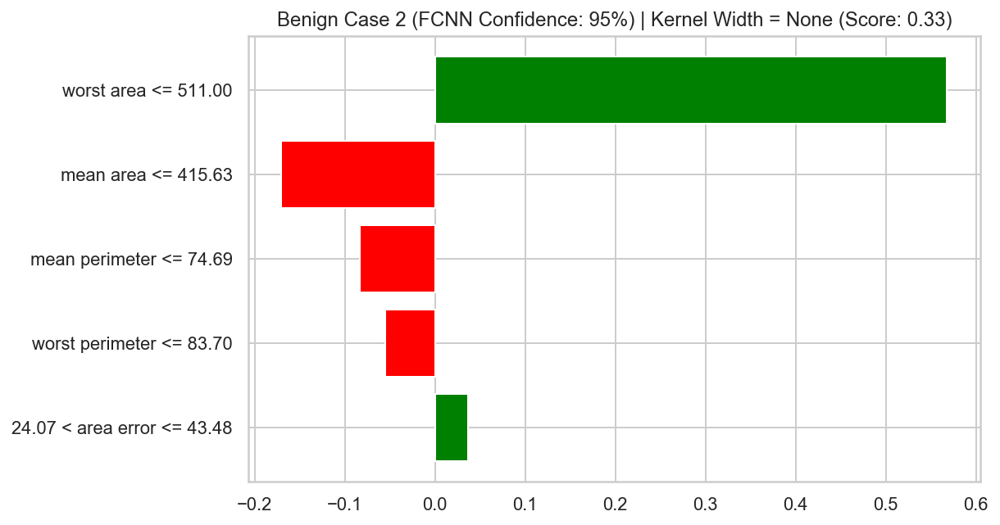

In [75]:
benign_idx2 = np.where(y_test.numpy() == 1)[0][1]
exp = explainer.explain_instance(X_test.numpy()[benign_idx2], 
                                 prob, 
                                 num_features=5, 
                                 top_labels=1)
f, ax = lime_exp_as_pyplot(exp)
ax.set_title('Benign Case 2 (FCNN Confidence: %d%%) | Kernel Width = None (Score: %.2f)' % (round(y_conf[benign_idx2] * 100),
                                                                                            exp.score))
f.savefig('images/chapter_04_lime_benign2.png', dpi=300, bbox_inches='tight');
f.savefig('images/chapter_04_lime_benign2.svg', format='svg', dpi=300, bbox_inches='tight');

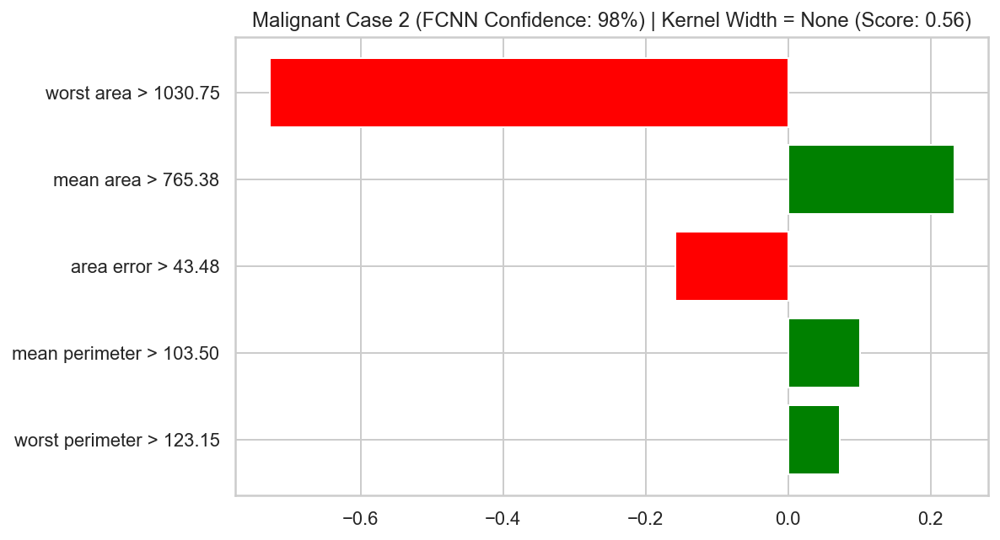

In [72]:
malignant_idx2 = np.where(y_test.numpy() == 0)[0][1]
exp = explainer.explain_instance(X_test.numpy()[malignant_idx2], 
                                 prob, 
                                 num_features=5, 
                                 top_labels=1)
f, ax = lime_exp_as_pyplot(exp)
ax.set_title('Malignant Case 2 (FCNN Confidence: %d%%) | Kernel Width = None (Score: %.2f)' % (100 - round(y_conf[malignant_idx2] * 100),
                                                                                               exp.score))
f.savefig('images/chapter_04_lime_malignant2.png', dpi=300, bbox_inches='tight');
f.savefig('images/chapter_04_lime_malignant2.svg', format='svg', dpi=300, bbox_inches='tight');

In [48]:
explainer_kw1 = lime.lime_tabular.LimeTabularExplainer(X_train.numpy(), 
                                                       feature_names=data.feature_names, 
                                                       class_names=data.target_names,
                                                       kernel_width=1,
                                                       discretize_continuous=True)

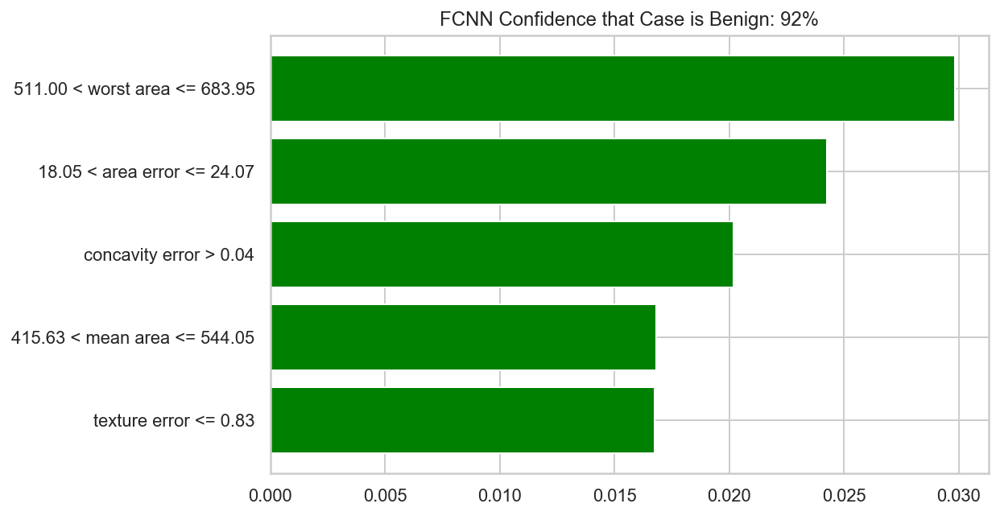

In [58]:
exp = explainer_kw1.explain_instance(X_test.numpy()[benign_idx], 
                                     prob, 
                                     num_features=5, 
                                     top_labels=1)
f, ax = lime_exp_as_pyplot(exp)
ax.set_title('FCNN Confidence that Case is Benign: %d%%' % (round(y_conf[benign_idx] * 100)))
f.savefig('images/chapter_04_lime_benign_kw1.png', dpi=300, bbox_inches='tight');
f.savefig('images/chapter_04_lime_benign_kw1.svg', format='svg', dpi=300, bbox_inches='tight');

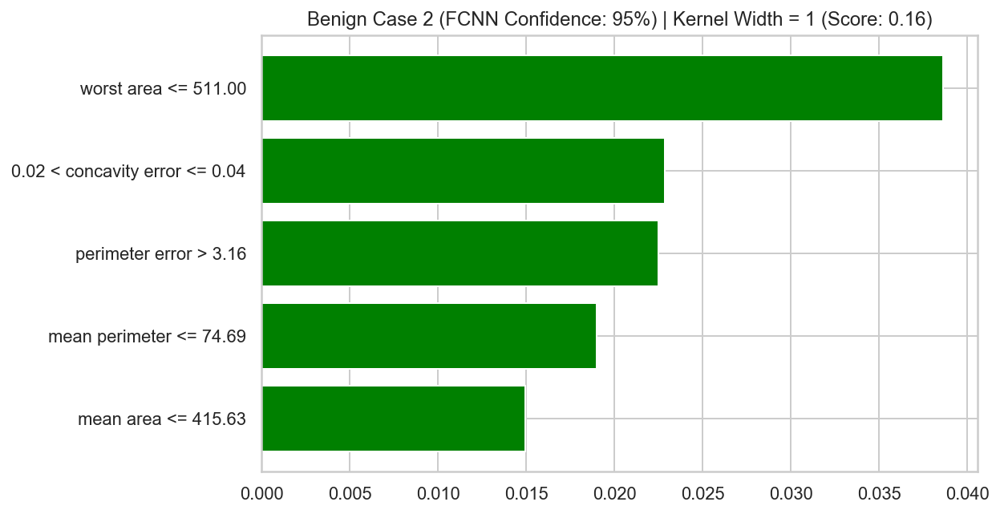

In [74]:
exp = explainer_kw1.explain_instance(X_test.numpy()[benign_idx2], 
                                     prob, 
                                     num_features=5, 
                                     top_labels=1)
f, ax = lime_exp_as_pyplot(exp)
ax.set_title('Benign Case 2 (FCNN Confidence: %d%%) | Kernel Width = 1 (Score: %.2f)' % (round(y_conf[benign_idx2] * 100),
                                                                                         exp.score))
f.savefig('images/chapter_04_lime_benign_kw1_2.png', dpi=300, bbox_inches='tight');
f.savefig('images/chapter_04_lime_benign_kw1_2.svg', format='svg', dpi=300, bbox_inches='tight');

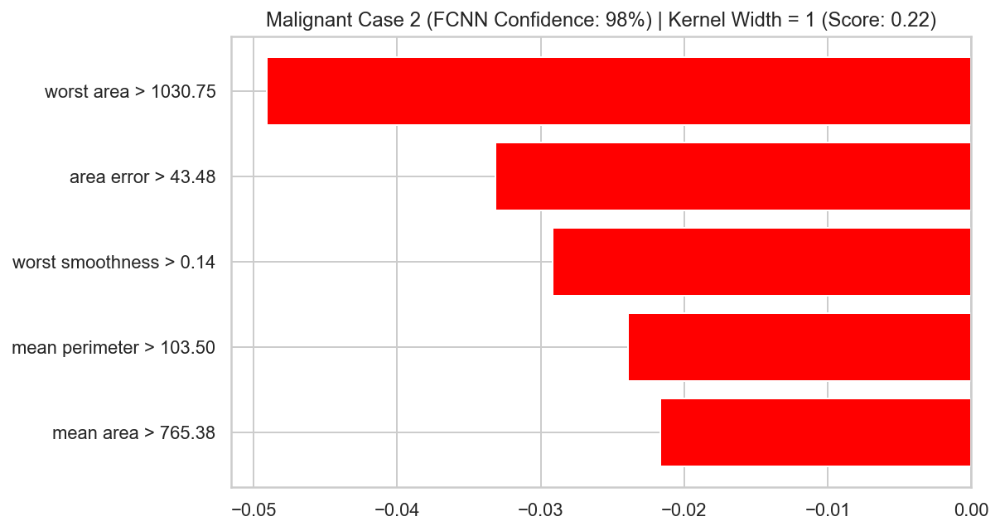

In [70]:
malignant_idx2 = np.where(y_test.numpy() == 0)[0][1]
exp = explainer_kw1.explain_instance(X_test.numpy()[malignant_idx2], 
                                     prob, 
                                     num_features=5, 
                                     top_labels=1)
f, ax = lime_exp_as_pyplot(exp)
ax.set_title('Malignant Case 2 (FCNN Confidence: %d%%) | Kernel Width = 1 (Score: %.2f)' % (100 - round(y_conf[malignant_idx2] * 100),
                                                                                          exp.score))
f.savefig('images/chapter_04_lime_malignant_kw1_2.png', dpi=300, bbox_inches='tight');
f.savefig('images/chapter_04_lime_malignant_kw1_2.svg', format='svg', dpi=300, bbox_inches='tight');

In [67]:
exp.score

0.5724022935174513

# SHAP Explainer

First uninstall shap and install from my github [fork](https://github.com/thampiman/shap) to be able to obtain the matplotlib figure and axes to allow for customizations and image exports. A [pull request](https://github.com/slundberg/shap/pull/1103) has been submitted to the base SHAP master branch but until that is merged, please use my github fork if you'd like to export matplotlib plots.

In [28]:
!pip uninstall -y shap
!pip install git+https://github.com/thampiman/shap

  Cloning https://github.com/thampiman/shap to /private/var/folders/gf/_x0rwz455l1_jjg78trkrlrc0000gn/T/pip-req-build-u1xzt_h7
  Running command git clone -q https://github.com/thampiman/shap /private/var/folders/gf/_x0rwz455l1_jjg78trkrlrc0000gn/T/pip-req-build-u1xzt_h7
  Created wheel for shap: filename=shap-0.35.0-cp37-cp37m-macosx_10_7_x86_64.whl size=311352 sha256=b8e7211a72a93776c3d5404e443e3e8888c7c6120a5474f88281d6a19528a18f
  Stored in directory: /private/var/folders/gf/_x0rwz455l1_jjg78trkrlrc0000gn/T/pip-ephem-wheel-cache-h_qqgwbr/wheels/18/ce/c4/2276771232fac42d0776f309e1dda9cc8d8d9380346993263e
Successfully built shap


In [81]:
import shap
# print the JS visualization code to the notebook
shap.initjs()

In [82]:
def prob(data):
    return model.forward(Variable(torch.from_numpy(data)).float()).detach().numpy().reshape(-1, 1)

In [83]:
shap_explainer = shap.KernelExplainer(prob, 
                                      X_train.numpy(), 
                                      link="logit")
shap_values = shap_explainer.shap_values(X_test.numpy(), nsamples=100)

Using 398 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


In [84]:
benign_idx = np.where(y_test.numpy() == 1)[0][0]
malignant_idx = np.where(y_test.numpy() == 0)[0][0]
benign_idx2 = np.where(y_test.numpy() == 1)[0][1]
malignant_idx2 = np.where(y_test.numpy() == 0)[0][1]

In [85]:
df_test = pd.DataFrame(X_test.numpy(), columns=data['feature_names'])

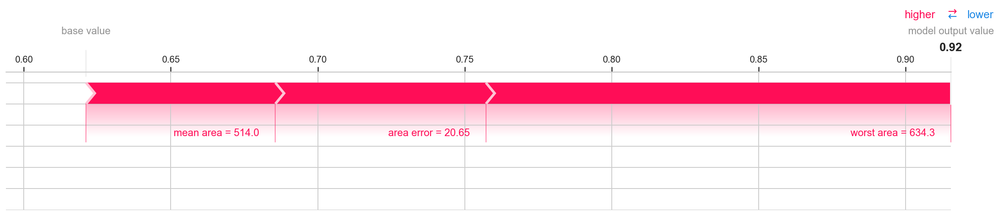

In [86]:
# Plot the SHAP values for the Benign case
f, ax = shap.force_plot(shap_explainer.expected_value[0], 
                        shap_values[0][benign_idx,:], 
                        X_test.numpy()[benign_idx,:],
                        feature_names=data['feature_names'],
                        link="logit",
                        matplotlib=True)
f.savefig('images/chapter_04_shap_benign.png', dpi=300, bbox_inches='tight');
f.savefig('images/chapter_04_shap_benign.svg', format='svg', dpi=300, bbox_inches='tight');

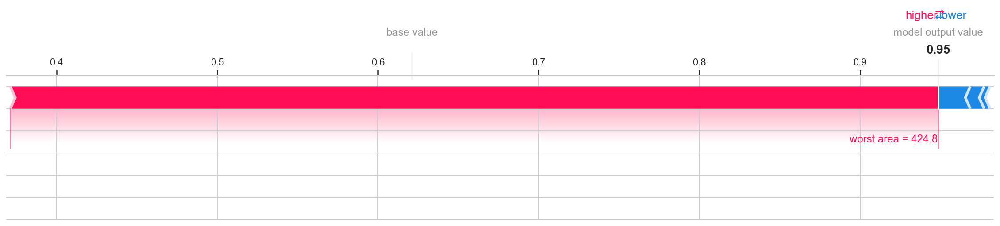

In [87]:
# Plot the SHAP values for the Benign case
f, ax = shap.force_plot(shap_explainer.expected_value[0], 
                        shap_values[0][benign_idx2,:], 
                        X_test.numpy()[benign_idx2,:],
                        feature_names=data['feature_names'],
                        link="logit",
                        matplotlib=True)
f.savefig('images/chapter_04_shap_benign2.png', dpi=300, bbox_inches='tight');
f.savefig('images/chapter_04_shap_benign2.svg', format='svg', dpi=300, bbox_inches='tight');

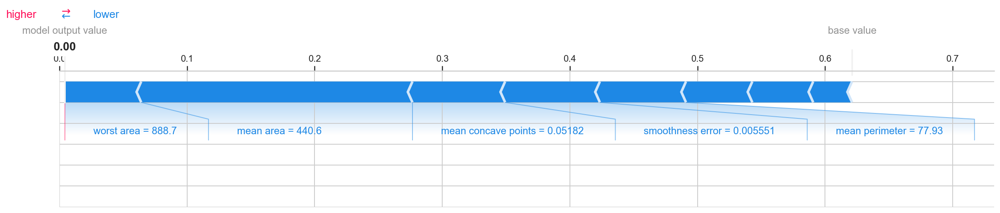

In [88]:
# Plot the SHAP values for the Malignant case
f, ax = shap.force_plot(shap_explainer.expected_value[0], 
                        shap_values[0][malignant_idx,:], 
                        X_test.numpy()[malignant_idx,:], 
                        feature_names=data['feature_names'],
                        link="logit",
                        matplotlib=True)
f.savefig('images/chapter_04_shap_malignant.png', dpi=300, bbox_inches='tight');
f.savefig('images/chapter_04_shap_malignant.svg', format='svg', dpi=300, bbox_inches='tight');

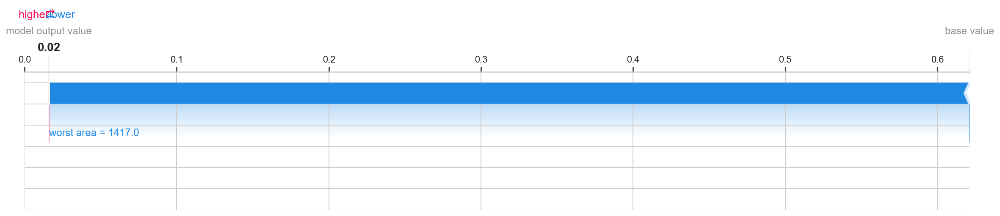

In [89]:
# Plot the SHAP values for the Malignant case
f, ax = shap.force_plot(shap_explainer.expected_value[0], 
                        shap_values[0][malignant_idx2,:], 
                        X_test.numpy()[malignant_idx2,:], 
                        feature_names=data['feature_names'],
                        link="logit",
                        matplotlib=True)
f.savefig('images/chapter_04_shap_malignant2.png', dpi=300, bbox_inches='tight');
f.savefig('images/chapter_04_shap_malignant2.svg', format='svg', dpi=300, bbox_inches='tight');

# Anchor Explainer

In [90]:
from anchor import utils
from anchor import anchor_tabular

In [91]:
data.keys()

dict_keys(['data', 'target', 'target_names', 'DESCR', 'feature_names', 'filename'])

In [92]:
anchor_explainer = anchor_tabular.AnchorTabularExplainer(
    data.target_names, 
    data.feature_names, 
    X_train.numpy(),
    categorical_names={})
anchor_explainer.fit(X_train.numpy(), 
                     y_train.numpy(), 
                     X_val.numpy(), 
                     y_val.numpy())

In [93]:
def pred(data):
    pred = model.forward(
        Variable(torch.from_numpy(data)).float()).\
    detach().numpy().reshape(-1) > 0.5
    return np.array([1 if p == True else 0 for p in pred])

In [94]:
benign_idx = np.where(y_test.numpy() == 1)[0][0]
malignant_idx = np.where(y_test.numpy() == 0)[0][0]
benign_idx2 = np.where(y_test.numpy() == 1)[0][1]
malignant_idx2 = np.where(y_test.numpy() == 0)[0][1]

In [97]:
exp = anchor_explainer.explain_instance(X_test.numpy()[benign_idx], 
                                        pred, 
                                        threshold=0.95)
print('Prediction: ', anchor_explainer.class_names[pred(X_test.numpy()[benign_idx])][0])
print('Anchor: %s' % (' AND '.join(exp.names())))
print('Precision: %.3f' % exp.precision())
print('Coverage: %.3f' % exp.coverage())

Prediction:  benign
Anchor: worst area <= 683.95
Precision: 1.000
Coverage: 0.495


In [98]:
exp.save_to_file('images/chapter_04_anchors_benign_explanation.html')
exp.show_in_notebook()

In [99]:
print('Prediction: ', anchor_explainer.class_names[pred(X_test.numpy()[benign_idx2])][0])
exp = anchor_explainer.explain_instance(X_test.numpy()[benign_idx2], pred, threshold=0.95)
print('Anchor: %s' % (' AND '.join(exp.names())))
print('Precision: %.3f' % exp.precision())
print('Coverage: %.3f' % exp.coverage())

Prediction:  benign
Anchor: worst area <= 511.00
Precision: 1.000
Coverage: 0.186


In [100]:
exp.save_to_file('images/chapter_04_anchors_benign_explanation2.html')
exp.show_in_notebook()

In [101]:
print('Prediction: ', anchor_explainer.class_names[pred(X_test.numpy()[malignant_idx])][0])
exp = anchor_explainer.explain_instance(X_test.numpy()[malignant_idx], pred, threshold=0.95)
print('Anchor: %s' % (' AND '.join(exp.names())))
print('Precision: %.3f' % exp.precision())
print('Coverage: %.3f' % exp.coverage())

Prediction:  malignant
Anchor: worst area > 683.95 AND mean radius <= 13.27
Precision: 0.990
Coverage: 0.011


In [102]:
exp.save_to_file('images/chapter_04_anchors_malignant_explanation.html')
exp.show_in_notebook()

In [103]:
print('Prediction: ', anchor_explainer.class_names[pred(X_test.numpy()[malignant_idx2])][0])
exp = anchor_explainer.explain_instance(X_test.numpy()[malignant_idx2], pred, threshold=0.95)
print('Anchor: %s' % (' AND '.join(exp.names())))
print('Precision: %.3f' % exp.precision())
print('Coverage: %.3f' % exp.coverage())

Prediction:  malignant
Anchor: worst area > 1030.75
Precision: 1.000
Coverage: 0.271


In [104]:
exp.save_to_file('images/chapter_04_anchors_malignant_explanation2.html')
exp.show_in_notebook()